In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import os
from tqdm import tqdm
from astropy.io import fits
from astropy.wcs import WCS
from astropy.wcs.utils import pixel_to_skycoord, skycoord_to_pixel
from astropy.coordinates import SkyCoord
from astropy.nddata import Cutout2D
tqdm.pandas()

C:\Users\Matt\.conda\envs\tf2-gpu\lib\site-packages\tqdm\std.py:706: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [2]:
from reproject.mosaicking import find_optimal_celestial_wcs
from reproject import reproject_interp
from reproject.mosaicking import reproject_and_coadd

In [3]:
PATH_RAW = 'D:/Workshop/PhD/Data/ViaLactea/PPMAP_Results/'
PATH_64PX = 'D:/Workshop/PhD/Data/ViaLactea/CNN_Results/64px_fulltile/'
PATH_32PX = 'D:/Workshop/PhD/Data/ViaLactea/CNN_Results/64px_32px_fulltile/'

In [4]:
hdus = [fits.open(f'{PATH_RAW}{folder}/{folder[:4]}_cdens.fits')[0] for folder in tqdm(os.listdir(PATH_RAW))]

100%|████████████████████████████████████████████████████████████████████████████████| 163/163 [00:06<00:00, 24.86it/s]


In [33]:
N = 4
hdu_toward = [hdus[0]]
hdu_away = [hdus[81]]
for n in range(N):
    print(n)
    hdu_toward.append(hdus[n+1])
    hdu_toward.append(hdus[-(n+1)])
    
    hdu_away.append(hdus[n+1+81])
    hdu_away.append(hdus[81-1-n])
print(hdu_toward)
print(hdu_away)

0
1
2
3
[<astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F53EA88>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F54C788>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F78F988>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F5554C8>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F78A108>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F55C248>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F7837C8>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F55C348>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F77FE08>]
[<astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F67B9C8>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F67F288>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F677048>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F67F308>, <astropy.io.fits.hdu.image.PrimaryHDU object at 0x000001B52F670708>, <astropy.io.fits.hdu.ima

In [34]:
wcs_toward, shape_toward = find_optimal_celestial_wcs(hdu_toward,projection='CAR')
array_toward, footprint_toward = reproject_and_coadd(hdu_toward,
                                       wcs_toward, shape_out=shape_toward,
                                       reproject_function=reproject_interp)

wcs_away, shape_away = find_optimal_celestial_wcs(hdu_away,projection='CAR')
array_away, footprint_away = reproject_and_coadd(hdu_away,
                                       wcs_away, shape_out=shape_away,
                                       reproject_function=reproject_interp)

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:21<00:00,  2.41s/it]


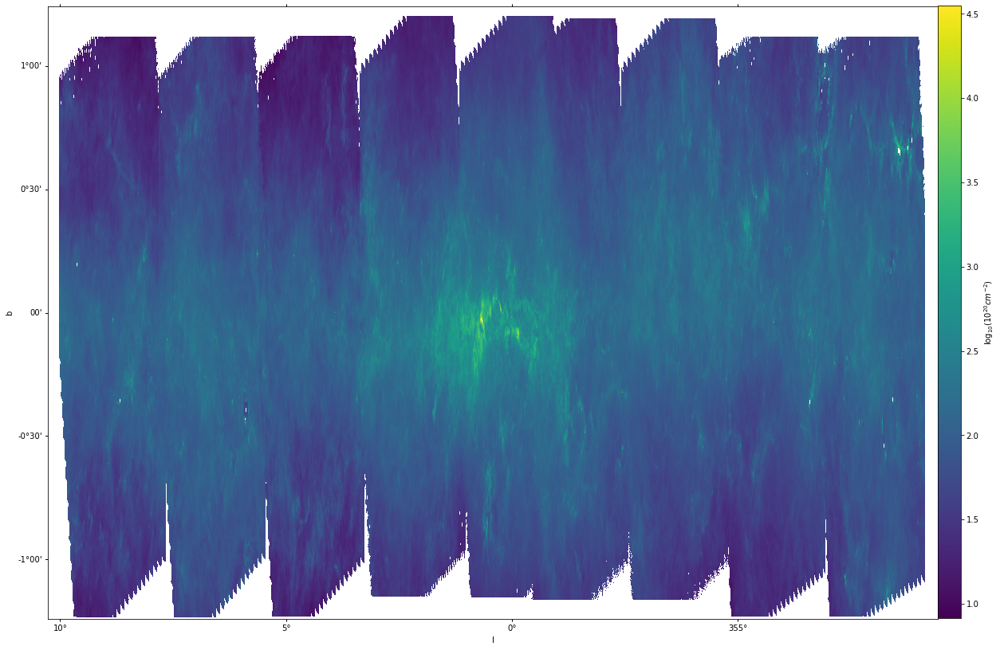

In [35]:
plt.figure(figsize=(10*2, (10/1.4142)*2))
ax1 = plt.subplot(1,1, 1, projection=wcs_toward)
plt.imshow(np.log10(array_toward), origin='lower', interpolation='nearest', aspect='auto')
ax1.set_xlabel('l')
ax1.set_ylabel('b')
offset = 150
left,right = ax1.get_xlim()
plt.xlim(left-offset, right+offset)

cax = plt.axes([0.9, 0.126, 0.02, 0.755])
plt.colorbar(cax=cax, label=r'$\log_{10}(10^{20} cm^{-2})$')

#plt.savefig('D:\Workshop\PhD\Papers\HiGal paper\Images/Raw_ColumnDensity_toward_away.png', bbox_inches="tight")

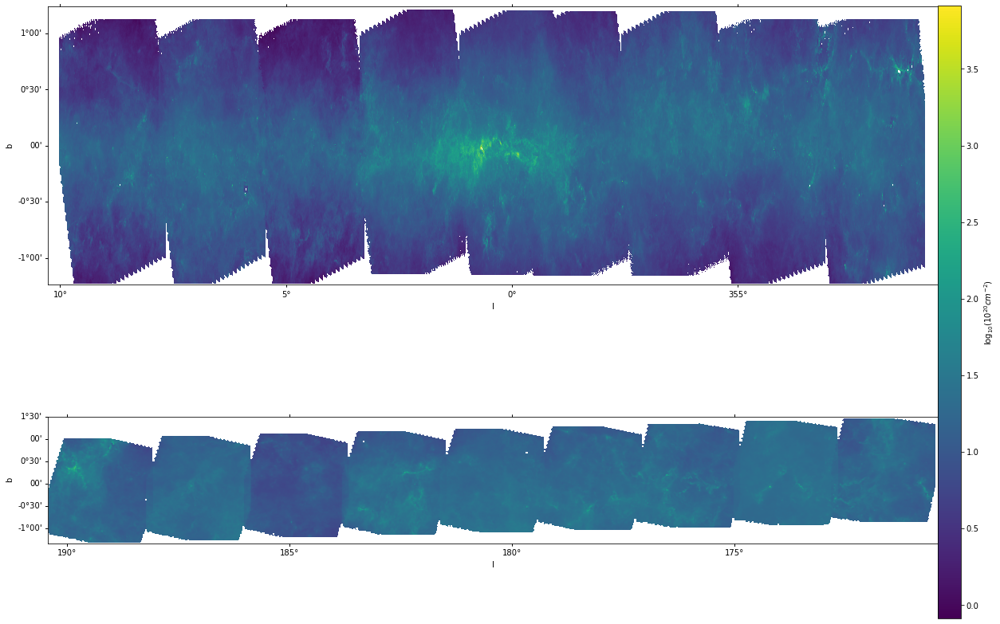

In [40]:
plt.figure(figsize=(10*2, (10/1.4142)*2))
ax1 = plt.subplot(2,1, 1, projection=wcs_toward)
plt.imshow(np.log10(array_toward), origin='lower', interpolation='nearest', aspect='auto')
ax1.set_xlabel('l')
ax1.set_ylabel('b')
offset = 150
left,right = ax1.get_xlim()
plt.xlim(left-offset, right+offset)

plt.subplot(2,1, 2, projection=wcs_away)
plt.imshow(np.log10(array_away), origin='lower')#, interpolation='nearest', aspect='auto')
plt.xlabel('l')
plt.ylabel('b')

cax = plt.axes([0.9, 0.126, 0.02, 0.755])
plt.colorbar(cax=cax, label=r'$\log_{10}(10^{20} cm^{-2})$')

#plt.savefig('D:\Workshop\PhD\Papers\HiGal paper\Images/Raw_ColumnDensity_toward_away.png', bbox_inches="tight")

In [13]:
hdu_away = [hdus[80],hdus[81],hdus[82]]
wcs_away, shape_away = find_optimal_celestial_wcs(hdu_away,projection='CAR')
array_away, footprint_away = reproject_and_coadd(hdu_away,
                                       wcs_away, shape_out=shape_away,
                                       reproject_function=reproject_interp)

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:07<00:00,  2.43s/it]


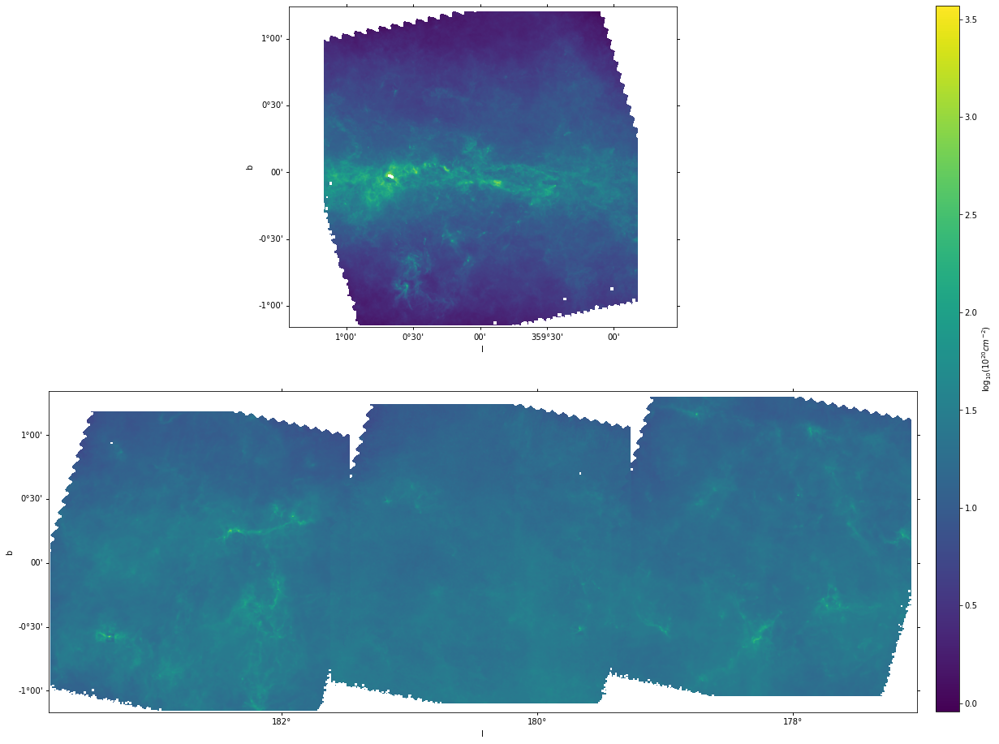

In [14]:
plt.figure(figsize=(10*2, 8*2))

ax1 = plt.subplot(2,1, 1, projection=wcs_toward)
plt.imshow(np.log10(array_toward), origin='lower')
ax1.set_xlabel('l')
ax1.set_ylabel('b')
offset = 150
left,right = ax1.get_xlim()
plt.xlim(left-offset, right+offset)

plt.subplot(2,1, 2, projection=wcs_away)
plt.imshow(np.log10(array_away), origin='lower')
plt.xlabel('l')
plt.ylabel('b')

cax = plt.axes([0.9, 0.126, 0.02, 0.755])
plt.colorbar(cax=cax, label=r'$\log_{10}(10^{20} cm^{-2})$')

#plt.savefig('D:\Workshop\PhD\Papers\HiGal paper\Images/Raw_ColumnDensity_toward_away.png', bbox_inches="tight")

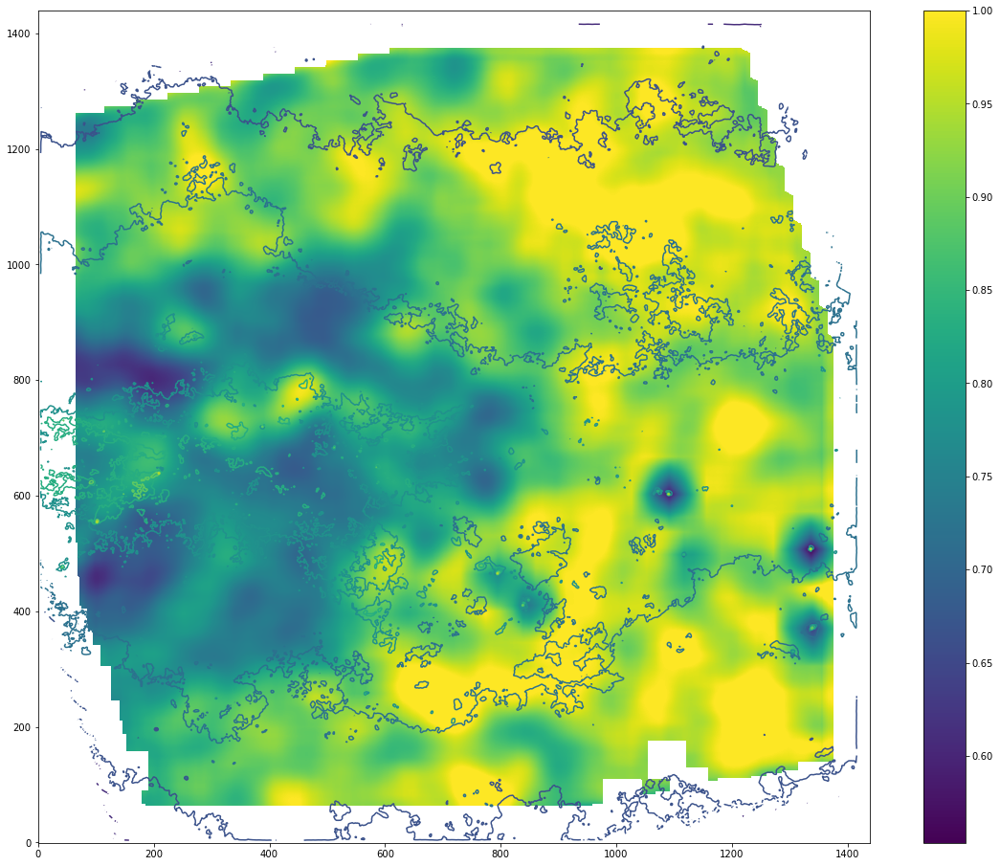

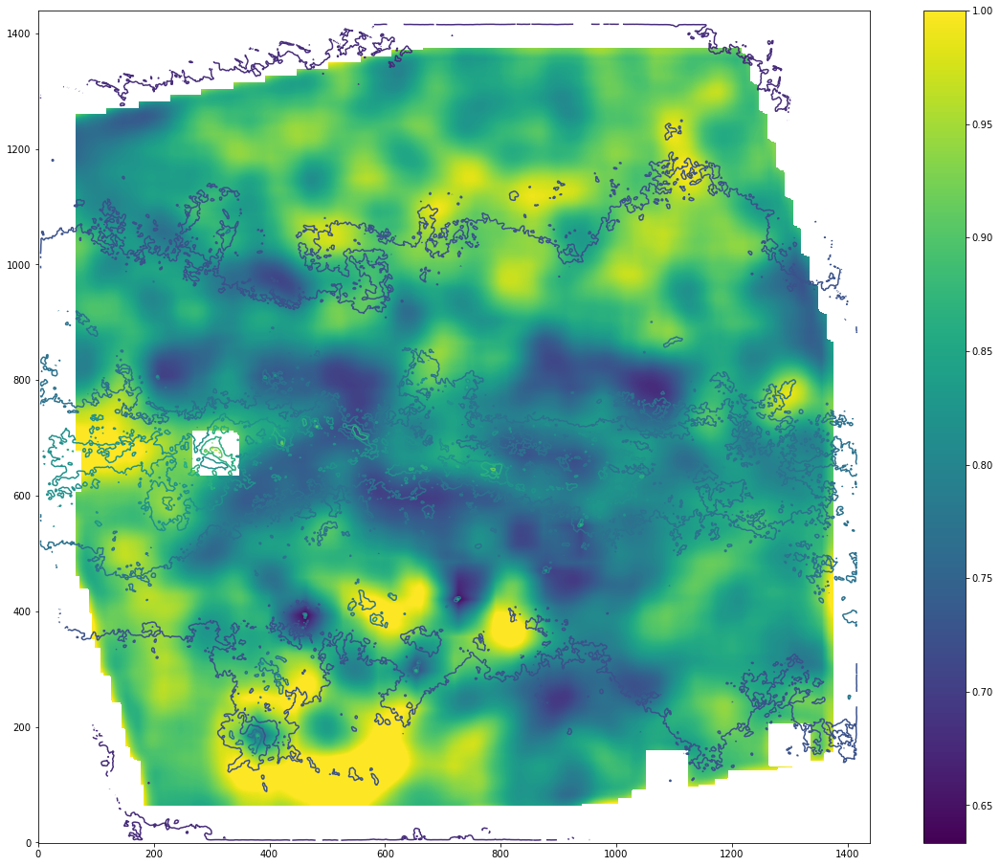

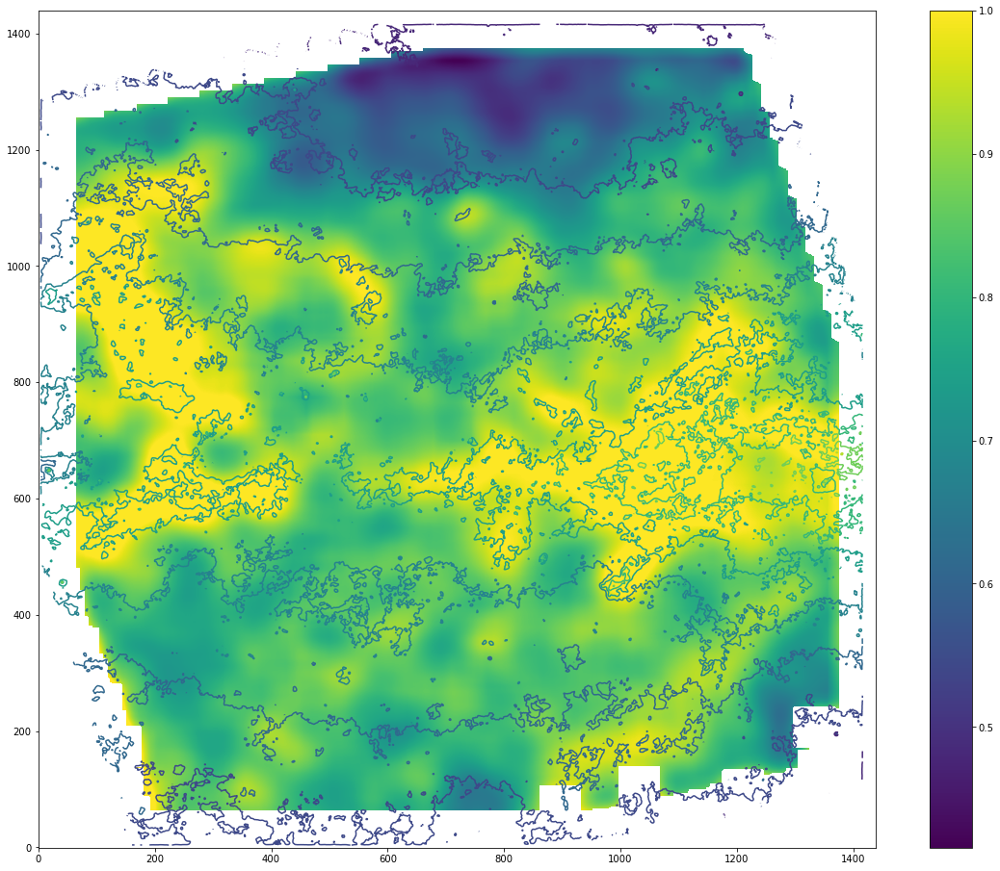

In [8]:
H1 = np.loadtxt(PATH_64PX+'H/avg_data/000.txt')
H1[H1==0] = np.nan
H1[H1>1] = 1

H2 = np.loadtxt(PATH_64PX+'H/avg_data/002.txt')
H2[H2==0] = np.nan
H2[H2>1] = 1

H0 = np.loadtxt(PATH_64PX+'H/avg_data/358.txt')
H0[H0==0] = np.nan
H0[H0>1] = 1



H178 = np.loadtxt(PATH_64PX+'H/avg_data/178.txt')
H178[H178==0] = np.nan
H178[H178>1] = 1

H180 = np.loadtxt(PATH_64PX+'H/avg_data/180.txt')
H180[H180==0] = np.nan
H180[H180>1] = 1

H182 = np.loadtxt(PATH_64PX+'H/avg_data/182.txt')
H182[H182==0] = np.nan
H182[H182>1] = 1



H_0 = hdus[-1].copy()
H_0.data = H0
H_1 = hdus[0].copy()
H_1.data = H1
H_2 = hdus[1].copy()
H_2.data = H2

H_178 = hdus[80].copy()
H_178.data = H178
H_180 = hdus[81].copy()
H_180.data = H180
H_182 = hdus[82].copy()
H_182.data = H182

plt.figure(figsize=(10*2, 8*2))
plt.imshow(H_0.data, origin='lower')
plt.colorbar()
plt.contour(np.log10(hdus[-1].data))
plt.show()

plt.figure(figsize=(10*2, 8*2))
plt.imshow(H_1.data, origin='lower')
plt.colorbar()
plt.contour(np.log10(hdus[0].data))
plt.show()

plt.figure(figsize=(10*2, 8*2))
plt.imshow(H_2.data, origin='lower')
plt.colorbar()
plt.contour(np.log10(hdus[1].data))
plt.show()

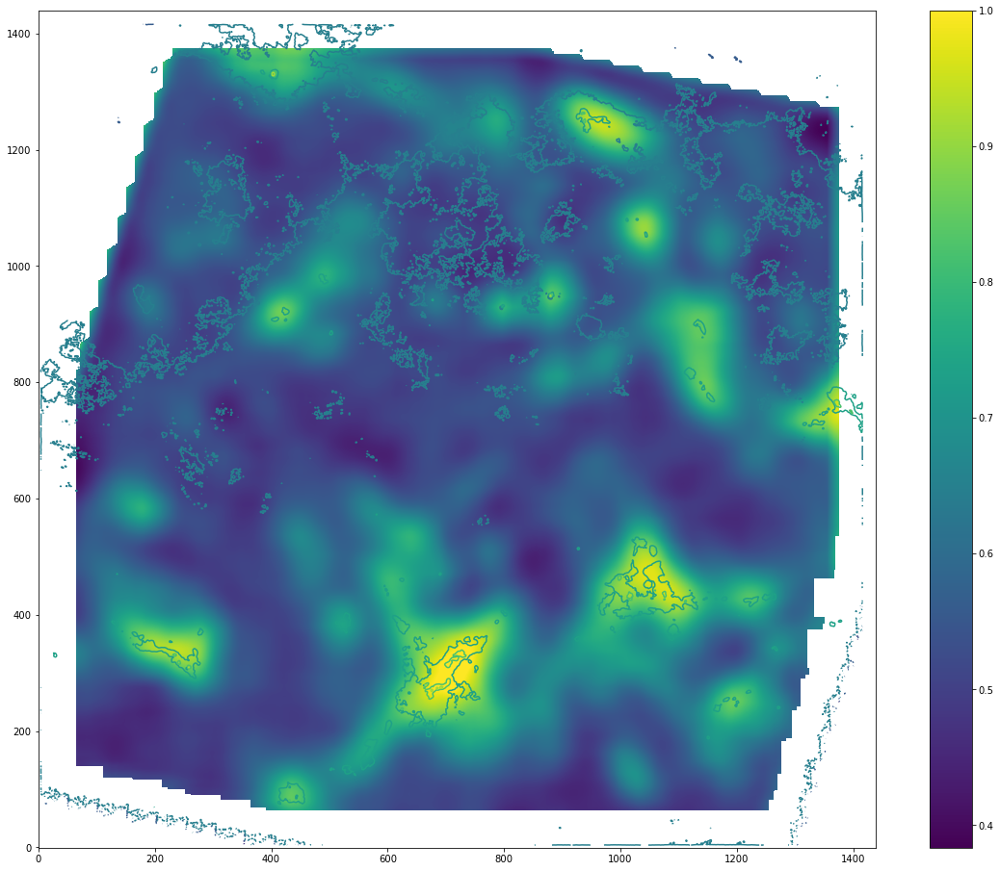

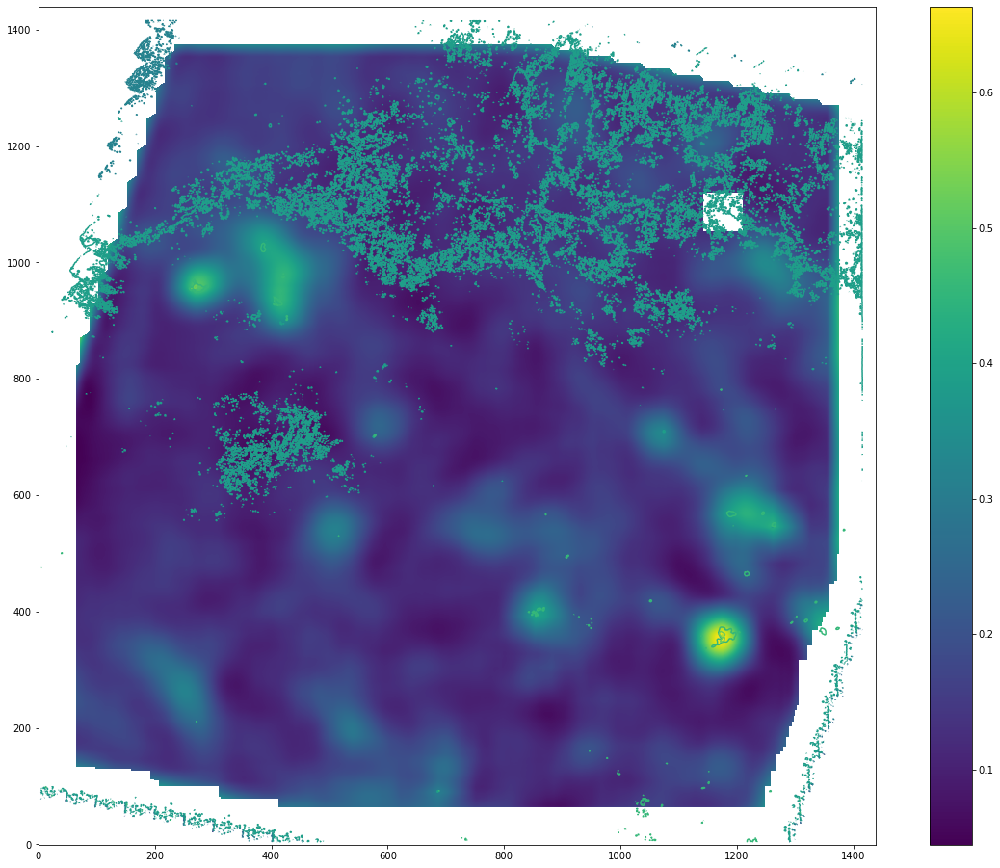

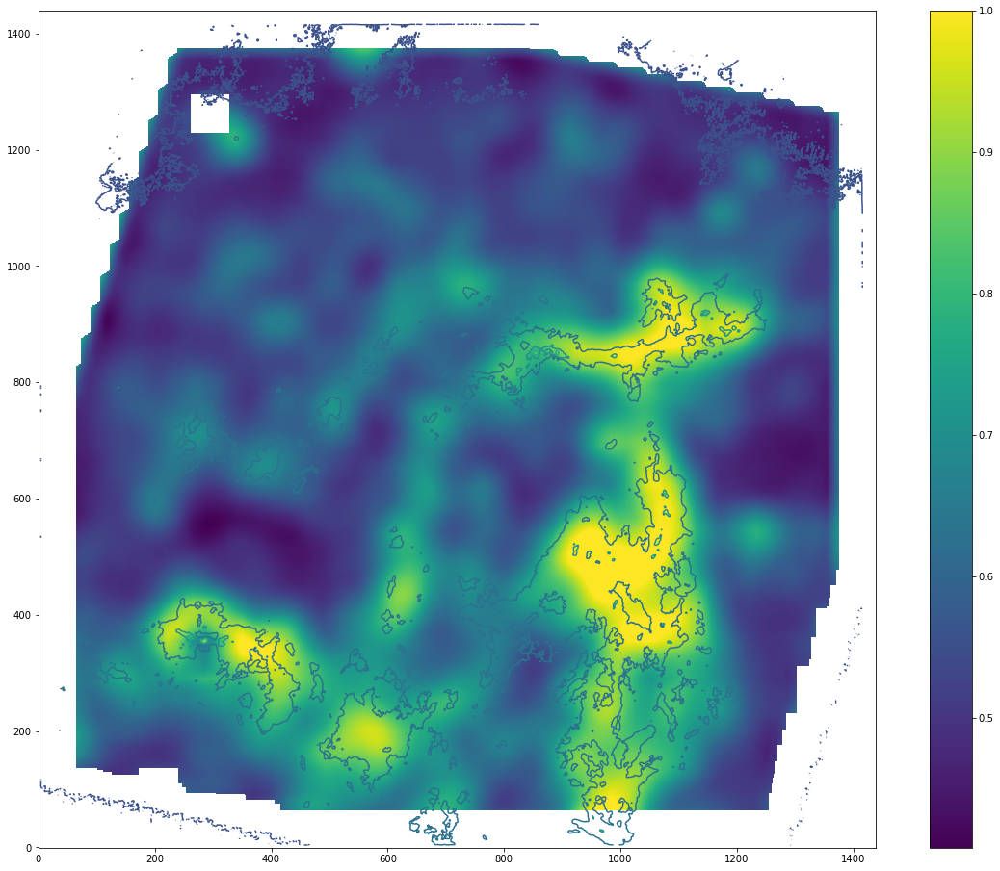

In [9]:
plt.figure(figsize=(10*2, 8*2))
plt.imshow(H_178.data, origin='lower')
plt.colorbar()
plt.contour(np.log10(hdus[80].data))
plt.show()

plt.figure(figsize=(10*2, 8*2))
plt.imshow(H_180.data, origin='lower')
plt.colorbar()
plt.contour(np.log10(hdus[81].data))
plt.show()

plt.figure(figsize=(10*2, 8*2))
plt.imshow(H_182.data, origin='lower')
plt.colorbar()
plt.contour(np.log10(hdus[82].data))
plt.show()

In [10]:
hdu_toward_H = [H_0,H_1,H_2]
wcs_toward_H, shape_toward_H = find_optimal_celestial_wcs(hdu_toward_H,projection='CAR')
array_toward_H, footprint_toward_H = reproject_and_coadd(hdu_toward_H,
                                       wcs_toward_H, shape_out=shape_toward_H,
                                       reproject_function=reproject_interp)

hdu_away_H = [H_178,H_180,H_182]
wcs_away_H, shape_away_H = find_optimal_celestial_wcs(hdu_away_H,projection='CAR')
array_away_H, footprint_away_H = reproject_and_coadd(hdu_away_H,
                                       wcs_away_H, shape_out=shape_away_H,
                                       reproject_function=reproject_interp)


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.14s/it]


C:\Users\Matt\.conda\envs\tf2-gpu\lib\site-packages\ipykernel_launcher.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


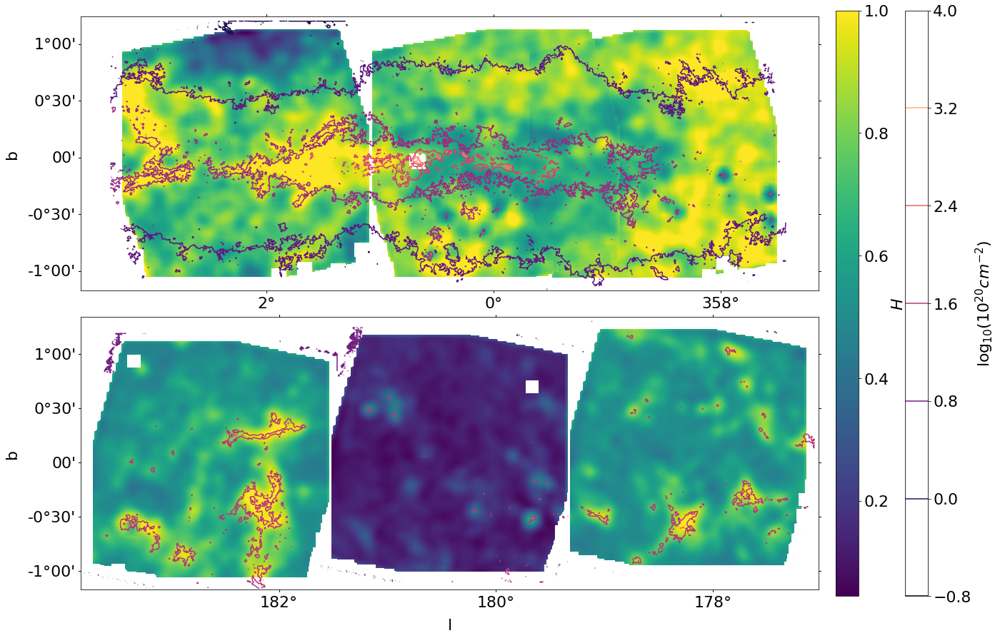

In [11]:
plt.figure(figsize=(10*1.5, 8*1.5))
plt.rcParams.update({'font.size': 22})

ax1 = plt.subplot(2,1, 1, projection=wcs_toward_H)
plt.imshow(array_toward_H, origin='lower')
ax1.set_xlabel('l')
ax1.set_ylabel('b')
ax1.contour(np.log10(array_toward), levels = 5, cmap='magma')
offset = 150
left,right = ax1.get_xlim()
plt.xlim(left-offset, right+offset)

plt.subplot(2,1, 2, projection=wcs_away_H)
im = plt.imshow(array_away_H, origin='lower')
plt.xlabel('l')
plt.ylabel('b')
cont = plt.contour(np.log10(array_away), levels = 5, cmap = 'magma')
ccax = plt.axes([1.09, 0.025, 0.03, 0.95])
plt.colorbar(cont, cax=ccax, label=r'$\log_{10}(10^{20} cm^{-2})$')


cax = plt.axes([1, 0.025, 0.03, 0.95])
plt.colorbar(im, cax=cax, label=r'$H$')
plt.tight_layout()
plt.savefig('D:\Workshop\PhD\Papers\HiGal paper\Images/H_64px_maps.png', bbox_inches="tight")

In [12]:
S1 = np.loadtxt(PATH_64PX+'S/avg_data/000.txt')
S1[S1==0] = np.nan
S1[S1<0] = 0

S2 = np.loadtxt(PATH_64PX+'S/avg_data/002.txt')
S2[S2==0] = np.nan
S2[S2<0]=0

S0 = np.loadtxt(PATH_64PX+'S/avg_data/358.txt')
S0[S0==0] = np.nan
S0[S0<0]=0



S178 = np.loadtxt(PATH_64PX+'S/avg_data/178.txt')
S178[S178==0] = np.nan
S178[S178<0]=0

S180 = np.loadtxt(PATH_64PX+'S/avg_data/180.txt')
S180[S180==0] = np.nan
S180[S180<0]=0

S182 = np.loadtxt(PATH_64PX+'S/avg_data/182.txt')
S182[S182==0] = np.nan
S182[S182<0]=0



S_0 = hdus[-1].copy()
S_0.data = S0
S_1 = hdus[0].copy()
S_1.data = S1
S_2 = hdus[1].copy()
S_2.data = S2

S_178 = hdus[80].copy()
S_178.data = S178
S_180 = hdus[81].copy()
S_180.data = S180
S_182 = hdus[82].copy()
S_182.data = S182

hdu_toward_S = [S_0,S_1,S_2]
wcs_toward_S, shape_toward_S = find_optimal_celestial_wcs(hdu_toward_S,projection='CAR')
array_toward_S, footprint_toward_S = reproject_and_coadd(hdu_toward_S,
                                       wcs_toward_S, shape_out=shape_toward_S,
                                       reproject_function=reproject_interp)

hdu_away_S = [S_178,S_180,S_182]
wcs_away_S, shape_away_S = find_optimal_celestial_wcs(hdu_away_S,projection='CAR')
array_away_S, footprint_away_S = reproject_and_coadd(hdu_away_S,
                                       wcs_away_S, shape_out=shape_away_S,
                                       reproject_function=reproject_interp)

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.07s/it]


C:\Users\Matt\.conda\envs\tf2-gpu\lib\site-packages\ipykernel_launcher.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


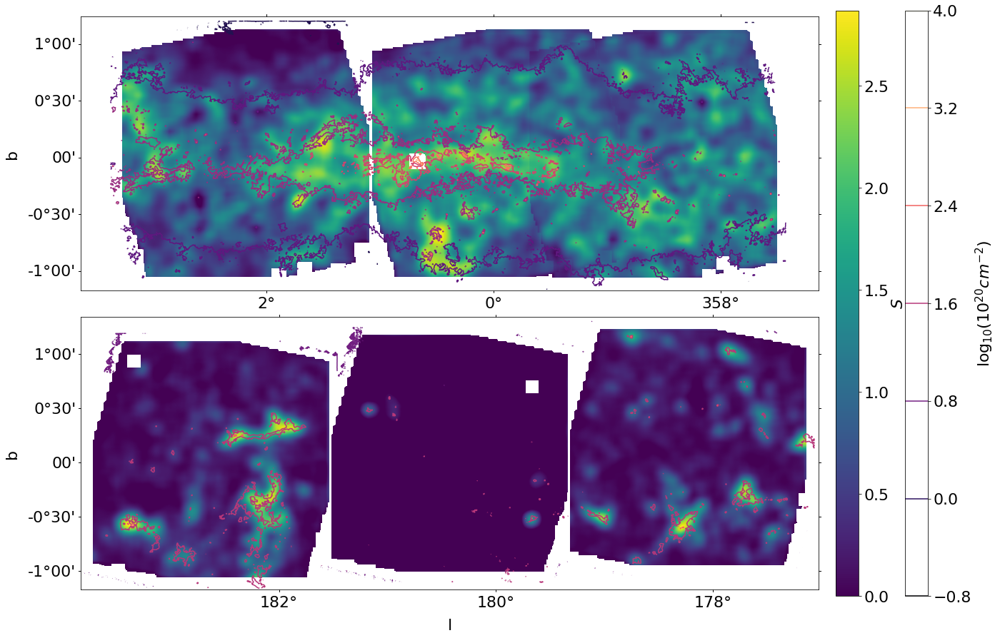

In [13]:
plt.figure(figsize=(10*1.5, 8*1.5))
plt.rcParams.update({'font.size': 22})

ax1 = plt.subplot(2,1, 1, projection=wcs_toward_S)
plt.imshow(array_toward_S, origin='lower')
ax1.set_xlabel('l')
ax1.set_ylabel('b')
ax1.contour(np.log10(array_toward), levels = 5, cmap='magma')
offset = 150
left,right = ax1.get_xlim()
plt.xlim(left-offset, right+offset)

plt.subplot(2,1, 2, projection=wcs_away_S)
im = plt.imshow(array_away_S, origin='lower')
plt.xlabel('l')
plt.ylabel('b')
cont = plt.contour(np.log10(array_away), levels = 5, cmap = 'magma')
ccax = plt.axes([1.09, 0.025, 0.03, 0.95])
plt.colorbar(cont, cax=ccax, label=r'$\log_{10}(10^{20} cm^{-2})$')


cax = plt.axes([1, 0.025, 0.03, 0.95])
plt.colorbar(im, cax=cax, label=r'$S$')
plt.tight_layout()
plt.savefig('D:\Workshop\PhD\Papers\HiGal paper\Images/S_64px_maps.png', bbox_inches="tight")

In [14]:
H1 = np.loadtxt(PATH_32PX+'H/avg_data/000.txt')
H1[H1==0] = np.nan
H1[H1>1] = 1

H2 = np.loadtxt(PATH_32PX+'H/avg_data/002.txt')
H2[H2==0] = np.nan
H2[H2>1] = 1

H0 = np.loadtxt(PATH_32PX+'H/avg_data/358.txt')
H0[H0==0] = np.nan
H0[H0>1] = 1



H178 = np.loadtxt(PATH_32PX+'H/avg_data/178.txt')
H178[H178==0] = np.nan
H178[H178>1] = 1

H180 = np.loadtxt(PATH_32PX+'H/avg_data/180.txt')
H180[H180==0] = np.nan
H180[H180>1] = 1

H182 = np.loadtxt(PATH_32PX+'H/avg_data/182.txt')
H182[H182==0] = np.nan
H182[H182>1] = 1



H_0 = hdus[-1].copy()
H_0.data = H0
H_1 = hdus[0].copy()
H_1.data = H1
H_2 = hdus[1].copy()
H_2.data = H2

H_178 = hdus[80].copy()
H_178.data = H178
H_180 = hdus[81].copy()
H_180.data = H180
H_182 = hdus[82].copy()
H_182.data = H182

hdu_toward_H = [H_0,H_1,H_2]
wcs_toward_H, shape_toward_H = find_optimal_celestial_wcs(hdu_toward_H,projection='CAR')
array_toward_H, footprint_toward_H = reproject_and_coadd(hdu_toward_H,
                                       wcs_toward_H, shape_out=shape_toward_H,
                                       reproject_function=reproject_interp)

hdu_away_H = [H_178,H_180,H_182]
wcs_away_H, shape_away_H = find_optimal_celestial_wcs(hdu_away_H,projection='CAR')
array_away_H, footprint_away_H = reproject_and_coadd(hdu_away_H,
                                       wcs_away_H, shape_out=shape_away_H,
                                       reproject_function=reproject_interp)

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.21s/it]


C:\Users\Matt\.conda\envs\tf2-gpu\lib\site-packages\ipykernel_launcher.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


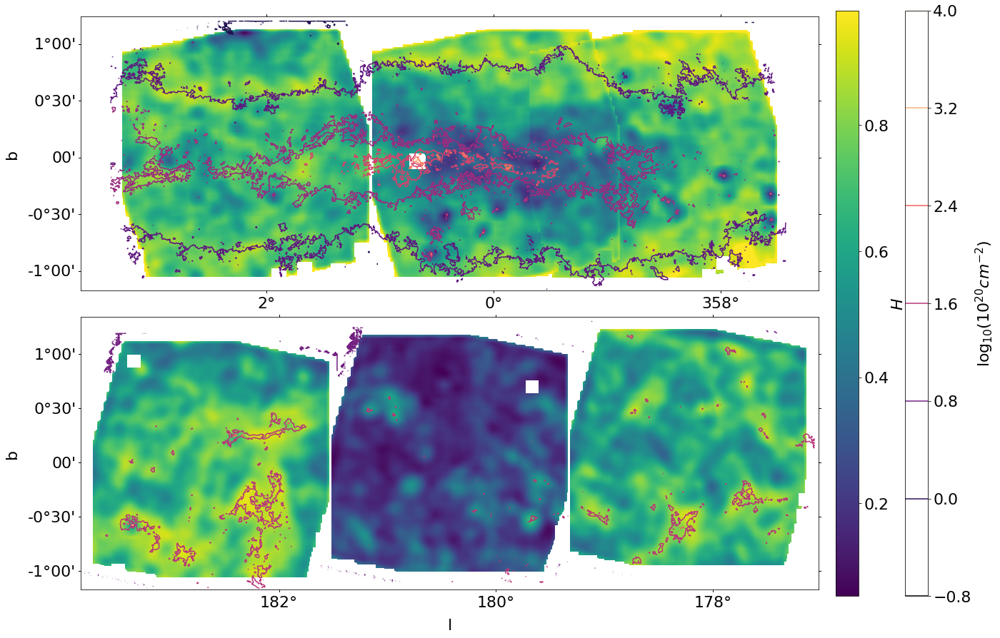

In [15]:
plt.figure(figsize=(10*1.5, 8*1.5))
plt.rcParams.update({'font.size': 22})

ax1 = plt.subplot(2,1, 1, projection=wcs_toward_S)
plt.imshow(array_toward_H, origin='lower')
ax1.set_xlabel('l')
ax1.set_ylabel('b')
ax1.contour(np.log10(array_toward), levels = 5, cmap='magma')
offset = 150
left,right = ax1.get_xlim()
plt.xlim(left-offset, right+offset)

plt.subplot(2,1, 2, projection=wcs_away_S)
im = plt.imshow(array_away_H, origin='lower')
plt.xlabel('l')
plt.ylabel('b')
cont = plt.contour(np.log10(array_away), levels = 5, cmap = 'magma')
ccax = plt.axes([1.09, 0.025, 0.03, 0.95])
plt.colorbar(cont, cax=ccax, label=r'$\log_{10}(10^{20} cm^{-2})$')


cax = plt.axes([1, 0.025, 0.03, 0.95])
plt.colorbar(im, cax=cax, label=r'$H$')
plt.tight_layout()
plt.savefig('D:\Workshop\PhD\Papers\HiGal paper\Images/H_32px_maps.png', bbox_inches="tight")

In [16]:
S1 = np.loadtxt(PATH_32PX+'S/avg_data/000.txt')
S1[S1==0] = np.nan
S1[S1<0] = 0

S2 = np.loadtxt(PATH_32PX+'S/avg_data/002.txt')
S2[S2==0] = np.nan
S2[S2<0]=0

S0 = np.loadtxt(PATH_32PX+'S/avg_data/358.txt')
S0[S0==0] = np.nan
S0[S0<0]=0



S178 = np.loadtxt(PATH_32PX+'S/avg_data/178.txt')
S178[S178==0] = np.nan
S178[S178<0]=0

S180 = np.loadtxt(PATH_32PX+'S/avg_data/180.txt')
S180[S180==0] = np.nan
S180[S180<0]=0

S182 = np.loadtxt(PATH_32PX+'S/avg_data/182.txt')
S182[S182==0] = np.nan
S182[S182<0]=0



S_0 = hdus[-1].copy()
S_0.data = S0
S_1 = hdus[0].copy()
S_1.data = S1
S_2 = hdus[1].copy()
S_2.data = S2

S_178 = hdus[80].copy()
S_178.data = S178
S_180 = hdus[81].copy()
S_180.data = S180
S_182 = hdus[82].copy()
S_182.data = S182

hdu_toward_S = [S_0,S_1,S_2]
wcs_toward_S, shape_toward_S = find_optimal_celestial_wcs(hdu_toward_S,projection='CAR')
array_toward_S, footprint_toward_S = reproject_and_coadd(hdu_toward_S,
                                       wcs_toward_S, shape_out=shape_toward_S,
                                       reproject_function=reproject_interp)

hdu_away_S = [S_178,S_180,S_182]
wcs_away_S, shape_away_S = find_optimal_celestial_wcs(hdu_away_S,projection='CAR')
array_away_S, footprint_away_S = reproject_and_coadd(hdu_away_S,
                                       wcs_away_S, shape_out=shape_away_S,
                                       reproject_function=reproject_interp)

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.18s/it]


C:\Users\Matt\.conda\envs\tf2-gpu\lib\site-packages\ipykernel_launcher.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


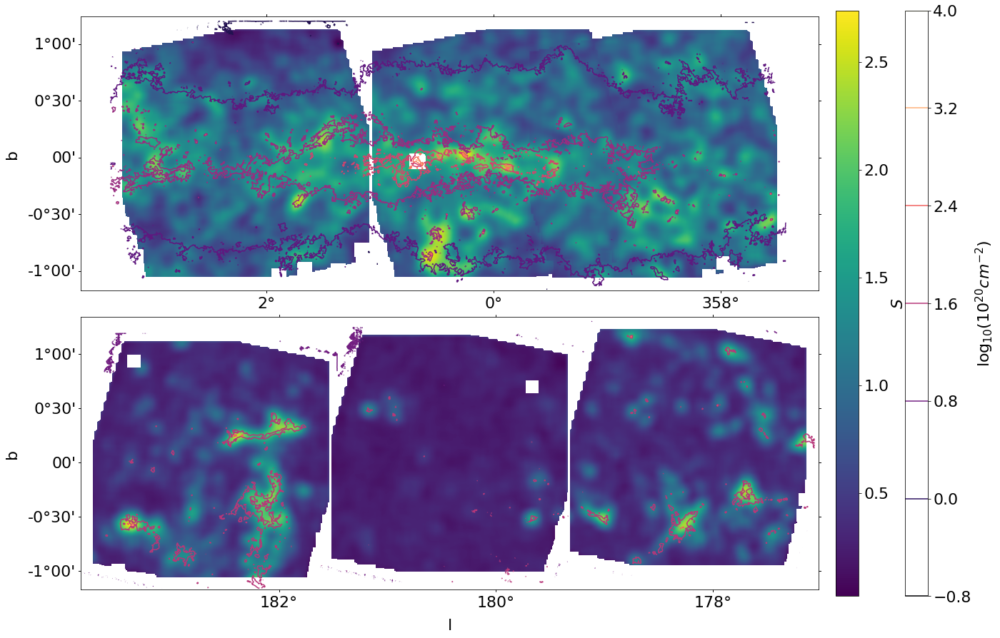

In [17]:
f = plt.figure(figsize=(10*1.5, 8*1.5))
plt.rcParams.update({'font.size': 22})

ax1 = plt.subplot(2,1, 1, projection=wcs_toward_S)
plt.imshow(array_toward_S, origin='lower')
ax1.set_xlabel('l')
ax1.set_ylabel('b')
ax1.contour(np.log10(array_toward), levels = 5, cmap='magma')
offset = 150
left,right = ax1.get_xlim()
plt.xlim(left-offset, right+offset)

plt.subplot(2,1, 2, projection=wcs_away_S)
im = plt.imshow(array_away_S, origin='lower')
plt.xlabel('l')
plt.ylabel('b')
cont = plt.contour(np.log10(array_away), levels = 5, cmap = 'magma')
ccax = plt.axes([1.09, 0.025, 0.03, 0.95])
plt.colorbar(cont, cax=ccax, label=r'$\log_{10}(10^{20} cm^{-2})$')


cax = plt.axes([1, 0.025, 0.03, 0.95])
plt.colorbar(im, cax=cax, label=r'$S$')
plt.tight_layout()
plt.savefig('D:\Workshop\PhD\Papers\HiGal paper\Images/S_32px_maps.png', bbox_inches="tight")

In [18]:
PATH_64PX = 'D:/Workshop/PhD/Data/ViaLactea/CNN_Results/64px_fulltile/'
PATH_32PX = 'D:/Workshop/PhD/Data/ViaLactea/CNN_Results/64px_32px_fulltile/'
PATH = 'D:/Workshop/PhD/Data/ViaLactea/PPMAP_Results/'

for folder in tqdm(os.listdir(PATH)):
    ######## Image, Lat, Lon ########
    direction = folder[1:4]
    hdu = fits.open(f'{PATH}{folder}/l{direction}_cdens.fits')[0]
    wcs = WCS(hdu.header)
    image_array = hdu.data
    shape = np.shape(image_array)
    x = np.arange(0, shape[0])
    y = np.arange(0, shape[1])
    xx, yy = np.meshgrid(x, y)
    coords_grid = pixel_to_skycoord(xx,yy, wcs)
    lat = coords_grid.l.degree
    lon = coords_grid.b.degree
    ######### 32PX H and S ########
    H_avg_array = np.loadtxt(f'{PATH_32PX}H/avg_data/{direction}.txt')
    H_avg_array[H_avg_array==0] = np.nan
    
    S_avg_array = np.loadtxt(f'{PATH_32PX}S/avg_data/{direction}.txt')
    S_avg_array[S_avg_array==0] = np.nan
    
    data_cube = np.array([image_array,H_avg_array,S_avg_array,lat,lon])
    
    pickle_out = open(f'D:/Workshop/PhD/Data/ViaLactea/CNN_Results/64px_32px_fulltile/DataCubes/l{direction}.pickle','wb')
    pickle.dump(data_cube,pickle_out)
    pickle_out.close()
    
    ######### 64PX H and S ########
    H_avg_array = np.loadtxt(f'{PATH_64PX}H/avg_data/{direction}.txt')
    H_avg_array[H_avg_array==0] = np.nan
    
    S_avg_array = np.loadtxt(f'{PATH_64PX}S/avg_data/{direction}.txt')
    S_avg_array[S_avg_array==0] = np.nan
    
    data_cube = np.array([image_array,H_avg_array,S_avg_array,lat,lon])
    
    pickle_out = open(f'D:/Workshop/PhD/Data/ViaLactea/CNN_Results/64px_fulltile/DataCubes/l{direction}.pickle','wb')
    pickle.dump(data_cube,pickle_out)
    pickle_out.close()

100%|████████████████████████████████████████████████████████████████████████████████| 163/163 [48:21<00:00, 17.80s/it]


In [3]:
df = pd.DataFrame(columns = ['ColumnDensity','H_32px','H_64px','S_64px','S_32px', 'Lon','Lat'])
df

,ColumnDensity,H_32px,H_64px,S_64px,S_32px,Lon,Lat


In [4]:
no_files = len(os.listdir(PATH_32PX+'DataCubes'))
no_files

163

In [5]:
for i in tqdm(range(no_files)):
    temp_df = pd.DataFrame()
    cube_64px = pickle.load(open(f'{PATH_64PX}/DataCubes/{os.listdir(PATH_64PX+"DataCubes")[i]}','rb'))
    cube_32px = pickle.load(open(f'{PATH_32PX}/DataCubes/{os.listdir(PATH_32PX+"DataCubes")[i]}','rb'))
    temp_df['ColumnDensity'] = cube_32px[0].flatten()
    temp_df['H_32px'] = cube_32px[1].flatten()
    temp_df['H_64px'] = cube_64px[1].flatten()
    temp_df['S_64px'] = cube_64px[2].flatten()
    temp_df['S_32px'] = cube_32px[2].flatten()
    temp_df['Lon'] = cube_32px[3].flatten()
    temp_df['Lat'] = cube_32px[4].flatten()
    temp_df = temp_df.dropna()
    df = df.append(temp_df)
    
df

100%|██████████████████████████████████████████████████████████████████████████████| 163/163 [1:25:31<00:00, 31.48s/it]


,ColumnDensity,H_32px,H_64px,S_64px,S_32px,Lon,Lat
90901,43.848316,1.132676,1.013105,0.182611,0.932583,0.878091,-1.054206
90902,44.163925,1.131395,1.007516,0.172928,0.909421,0.876424,-1.054207
90903,44.504650,1.129157,1.001265,0.163932,0.889960,0.874758,-1.054207
90904,44.041813,1.127536,0.994067,0.161262,0.872796,0.873091,-1.054208
90905,42.832348,1.122884,0.987209,0.158186,0.857919,0.871425,-1.054208
...,...,...,...,...,...,...,...
1982652,22.551447,1.097621,0.968311,0.882883,0.946514,357.765677,1.124606
1982653,22.340574,1.101608,0.969171,0.890893,0.945772,357.764010,1.124606
1982654,22.440014,1.105811,0.970310,0.900034,0.945458,357.762343,1.124605
1982655,22.937342,1.109802,0.970702,0.906340,0.945615,357.760677,1.124605


In [ ]:
import matplotlib as mpl
plt.rcParams.update({'font.size': 10})
f,ax = plt.subplots(5,5, figsize=(15,15),sharex='col')

#hists

ax[0,0].hist(df['H_32px'], bins=100)
ax[1,1].hist(df['H_64px'], bins=100)
ax[2,2].hist(df['S_32px'], bins=100)
ax[3,3].hist(df['S_64px'], bins=100)
ax[4,4].hist(df['Lon'], bins=100)

##1

ax[1,0].hist2d(df['H_32px'],df['H_64px'],bins=200, norm=mpl.colors.LogNorm())
z = np.polyfit(df['H_32px'], df['H_64px'], 1)
p = np.poly1d(z)
ax[1,0].plot([0,2], p([0,2]), c='r')
ax[1,0].text(0.015, 0.92, f'M={z[0]:.2f},C={z[1]:.2f}',transform=ax[1,0].transAxes,c='r')
ax[1,0].plot([0,2],[0,2],c='k')

##2

ax[2,0].hist2d(df['H_32px'],df['S_32px'],bins=200, norm=mpl.colors.LogNorm())

ax[2,1].hist2d(df['H_64px'],df['S_32px'],bins=200, norm=mpl.colors.LogNorm())

###3

ax[3,0].hist2d(df['H_32px'],df['S_64px'],bins=200, norm=mpl.colors.LogNorm())

ax[3,1].hist2d(df['H_64px'],df['S_64px'],bins=200, norm=mpl.colors.LogNorm())

ax[3,2].hist2d(df['S_32px'],df['S_64px'],bins=200, norm=mpl.colors.LogNorm())
z = np.polyfit(df['S_32px'], df['S_64px'], 1)
p = np.poly1d(z)
ax[3,2].plot([0,3], p([0,3]), c='r')
ax[3,2].text(0.015, 0.92, f'M={z[0]:.2f},C={z[1]:.2f}',transform=ax[3,2].transAxes,c='r')
ax[3,2].plot([0,3],[0,3],c='k')

##4

ax[4,0].hist2d(df['H_32px'],df['Lon'],bins=200, norm=mpl.colors.LogNorm())

ax[4,1].hist2d(df['H_64px'],df['Lon'],bins=200, norm=mpl.colors.LogNorm())
 
ax[4,2].hist2d(df['S_32px'],df['Lon'],bins=200, norm=mpl.colors.LogNorm())

ax[4,3].hist2d(df['S_64px'],df['Lon'],bins=200, norm=mpl.colors.LogNorm())

#labels

ax[0,0].set_ylabel('H_32px')
ax[1,0].set_ylabel('H_64px')
ax[2,0].set_ylabel('S_32px')
ax[3,0].set_ylabel('S_64px')
ax[4,0].set_ylabel('l')

ax[-1,0].set_xlabel('H_32px')
ax[-1,1].set_xlabel('H_64px')
ax[-1,2].set_xlabel('S_32px')
ax[-1,3].set_xlabel('S_64px')
ax[-1,4].set_xlabel('l')

ax[0,0].set_xlim([0,1.25])
ax[1,0].set_ylim([0,1.25])

ax[0,1].set_axis_off()
ax[0,2].set_axis_off()
ax[0,3].set_axis_off()
ax[0,4].set_axis_off()

ax[1,2].set_axis_off()
ax[1,3].set_axis_off()
ax[1,4].set_axis_off()

ax[2,3].set_axis_off()
ax[2,4].set_axis_off()

ax[3,4].set_axis_off()

plt.savefig('D:\Workshop\PhD\Papers\HiGal paper\Images/64pxVS32pxReduced.png',bbox_inches="tight")
plt.show()

In [30]:
df

,ColumnDensity,H_32px,H_64px,S_64px,S_32px,Lon,Lat
90901,43.848316,1.132676,1.013105,0.182611,0.932583,0.878091,-1.054206
90902,44.163925,1.131395,1.007516,0.172928,0.909421,0.876424,-1.054207
90903,44.504650,1.129157,1.001265,0.163932,0.889960,0.874758,-1.054207
90904,44.041813,1.127536,0.994067,0.161262,0.872796,0.873091,-1.054208
90905,42.832348,1.122884,0.987209,0.158186,0.857919,0.871425,-1.054208
...,...,...,...,...,...,...,...
1982652,22.551447,1.097621,0.968311,0.882883,0.946514,357.765677,1.124606
1982653,22.340574,1.101608,0.969171,0.890893,0.945772,357.764010,1.124606
1982654,22.440014,1.105811,0.970310,0.900034,0.945458,357.762343,1.124605
1982655,22.937342,1.109802,0.970702,0.906340,0.945615,357.760677,1.124605
